# Imports

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.exposure import equalize_adapthist
from skimage.filters.edges import sobel, scharr, farid, prewitt
from skimage.morphology import square, disk, remove_small_objects, erosion, dilation, closing, opening
from skimage.morphology import area_opening, binary_closing, binary_opening, binary_dilation, binary_erosion

from src.models import InputImage
from src.well import find_well_props

# Functions

In [ ]:
def plot_images(images, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary',
                title=None, hist=False, nums=False):
    if count is not None:
        images = images[0:count]

    l = len(images)

    if cols is None:
        cols = 4

    rows = int(l / cols)
    if l < cols: cols = l
    if l % cols != 0 or rows == 0:
        rows += 1

    fig, ax = plt.subplots(rows, cols, figsize=fig)
    ax = ax.ravel()
    for i, img in enumerate(images):
        if i >= l: return

        if nums: ax[i].set_title(f'#{i}')

        if not hist:
            ax[i].imshow(img, cmap)
            if not ticks:  # turn off ticks
                ax[i].get_xaxis().set_visible(False)
                ax[i].get_yaxis().set_visible(False)
        else:
            ax[i].hist(img.ravel(), bins=256)
    fig.suptitle(title, fontsize=56)
    plt.tight_layout()

In [ ]:
def plot_fishes(fishes, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary'):
    images = list(map(lambda x: x.processed, fishes))  # Change this!
    plot_images(images, cols, count, fig, ticks, cmap)

## Functions

In [ ]:
def denoising(img: np.ndarray, strength=20) -> np.ndarray:
    return cv2.fastNlMeansDenoising(img, None, strength)  # denoise
    #return wiener(img, (30,30))

In [ ]:
def adaptiveTh(img: np.ndarray, block_size=7, c=1) -> np.ndarray:
    return cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, block_size, c)

In [ ]:
def area_open(img: np.ndarray, th=500):
    return area_opening(img, area_threshold=th)

In [ ]:
def rangefilter(img: np.ndarray):
    d = dilation(img, square(3))  # max of 3x3 nbh
    e = erosion(img, square(3))  # min of 3x3 nbh
    return d - e

In [ ]:
def edge_finding(img: np.ndarray, mask=None) -> np.ndarray:  # Function replacing edge filter
    edges = rangefilter(img)  # rangefilter
    return equalize_adapthist(edges)  # strech contrast

## GetPlateWidthAndRemoveSides

In [ ]:
def get_menisc(binary_img: np.ndarray, mask: np.ndarray, corrected=False) -> np.ndarray:
    remaining_binary_img = binary_img.copy()

    if not corrected:
        structuring_element = disk(21)
        eroded_well = erosion(mask, structuring_element)
        remaining_binary_img[np.where(eroded_well > 0)] = 0
        remaining_binary_img = area_open(remaining_binary_img, 100).astype(bool)

    mh, mw = binary_img.shape[0], binary_img.shape[1]
    ch, cw = int(mh / 2), int(mw / 2)

    lt = remaining_binary_img[0:ch, 0:cw]
    lb = remaining_binary_img[ch:mh, 0:cw]
    rt = remaining_binary_img[0:ch, cw:mw]
    rb = remaining_binary_img[ch:mh, cw:mw]

    # plot_images([lt, rt, lb, rb], 2, fig=(60, 30))

    cont = get_perim(mask)

    lt_thresh = mean_4_col_sum(lt, "lt", cont)
    lb_thresh = mean_4_col_sum(lb, "lb", cont)
    rt_thresh = mean_4_col_sum(rt, "rt", cont)
    rb_thresh = mean_4_col_sum(rb, "rb", cont)

    left_side = np.concatenate((lt_thresh, lb_thresh), axis=0)
    right_side = np.concatenate((rt_thresh, rb_thresh), axis=0)
    full = np.concatenate((left_side, right_side), axis=1)

    return full

In [ ]:
def mean_4_col_sum(data: np.ndarray, corner: str, cont: np.ndarray):
    thresh_well = np.zeros_like(data)

    col_sum = np.sum(data, axis=0)

    csum = col_sum[col_sum > 0]  # columns where sum > 0

    if len(csum) == 0: return data

    mean_data = (np.floor(np.mean(csum)))

    if not np.isnan(mean_data):
        se = disk(mean_data)

        mh, mw = cont.shape[0], cont.shape[1],
        ch, cw = int(mh / 2), int(mw / 2)

        if corner == 'lt':
            thresh_well = dilation(cont[0:ch, 0:cw], se)
        elif corner == 'lb':
            thresh_well = dilation(cont[ch:mh, 0:cw], se)
        elif corner == 'rt':
            thresh_well = dilation(cont[0:ch, cw:mw], se)
        elif corner == 'rb':
            thresh_well = dilation(cont[ch:mh, cw:mw], se)
    return thresh_well

In [ ]:
def get_perim(bin_img: np.ndarray) -> np.ndarray:
    bw = bin_img
    se = disk(3)
    bw_erode = erosion(bw, se)
    return np.abs(np.subtract(bw_erode, bw))

# RUN!!!

# Fishes in extracted wells

In [ ]:
fishes = [InputImage("zf1.JPG"), InputImage("zf2.JPG"), InputImage("zf3.JPG"), InputImage("zf4.JPG"),
          InputImage("zf5.JPG"), InputImage("zf6.JPG"), InputImage("zf7.JPG"), InputImage("zf8.JPG")]

for fish in fishes:
    fish = find_well_props(fish)

# Searching for well properties
_____________________________________________________________
# Hough-transformation for the well
_____________________________________________________________
# Hough-transformation finished
_____________________________________________________________
# Creating circle mask for well
_____________________________________________________________
# Circle mask for well created
_____________________________________________________________
# Creating remaining masks:
_____________________________________________________________
# Creating cropped mask
_____________________________________________________________
# Creating masked image (original)
_____________________________________________________________
# Creating masked image (cropped)
_____________________________________________________________
# Created remaining masks
_____________________________________________________________
# Searching for well properties
______________________________________

In [ ]:
masks = []
maskeds = []
for fish in fishes:
    masks.append(fish.well_props.mask.cropped)
    maskeds.append(fish.well_props.mask.cropped_masked)

# Rangefilter*
With all available

In [ ]:
edge = []
edge_ = []
edge__ = []
edge___ = []
"""for fish in fishes:
    edges = edge_finding(fish.processed) # rangefilter
    n = cv2.normalize(src=edges, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)  # normalize for uint8
    fish.processed = n.astype(np.uint8)  # convert to uint8"""
for fish in fishes:
    rngfilter = rangefilter(fish.processed)
    n = cv2.normalize(rngfilter, None, 0, 255, cv2.NORM_MINMAX)
    edge.append(equalize_adapthist(n))
    """    a = sobel(fish.processed,
              mask=fish.well_props.mask.cropped)  #edge_finding(fish.processed, fish.well_props.mask.cropped)
    b = scharr(fish.processed, mask=fish.well_props.mask.cropped)
    c = farid(fish.processed, mask=fish.well_props.mask.cropped)
    d = prewitt(fish.processed, mask=fish.well_props.mask.cropped)

    n = cv2.normalize(src=a, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)  # normalize for uint8
    n_ = cv2.normalize(src=b, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    n__ = cv2.normalize(src=c, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    n___ = cv2.normalize(src=d, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)

    edge.append(n.astype(np.uint8))
    edge_.append(n_.astype(np.uint8))
    edge__.append(n__.astype(np.uint8))
    edge___.append(n___.astype(np.uint8))"""

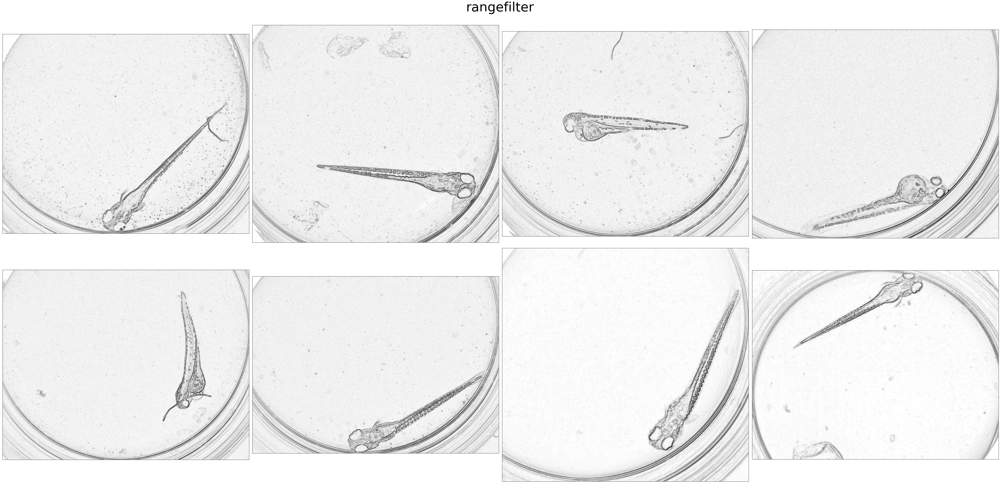

In [ ]:
# plot_fishes(fishes, fig=(20, 10))
hist = False
plot_images(edge, fig=(60, 30), cmap='binary', title='rangefilter', hist=hist)
#plot_images(edge_, fig=(60, 30), cmap='binary', title='scharr',hist=hist)
#plot_images(edge__, fig=(60, 30), cmap='binary', title='farid',hist=hist)
#plot_images(edge___, fig=(60, 30), cmap='binary', title='prewitt',hist=hist)

# Wiener filter*

In [27]:
from scipy.signal import wiener
from skimage.exposure import equalize_hist

denoised = []
# for fish in fishes:
#    fish.processed = denoising(fish.processed) # wiener filter
for i, fish in enumerate(edge):
    denoised.append((wiener(fish, 30)))

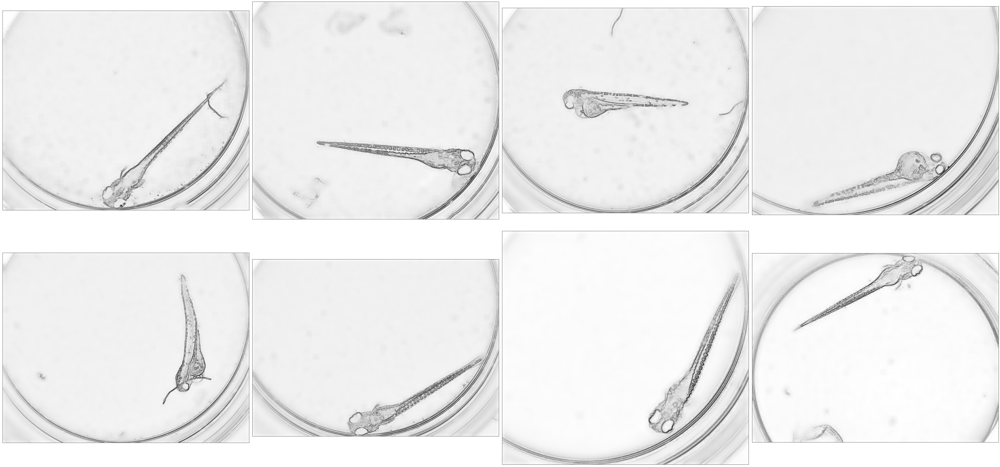

In [28]:
# plot_fishes(fishes, fig=(60, 30))
plot_images(denoised, fig=(60, 30))

# Adaptive threshold

In [42]:
ath = []
# for fish in fishes:
# fish.processed = adaptiveTh(fish.processed)
for i, fish in enumerate(denoised):
    # block = int(2 * np.floor(np.mean(np.asarray(fish.shape)) / 14) + 1) # Megpróbáltam a MATLABOSAT
    a=np.round(cv2.normalize(fish, None, 0, 255, cv2.NORM_MINMAX)).astype(np.uint8)
    ath.append(adaptiveTh(a, block_size=3).astype(bool) * masks[i])

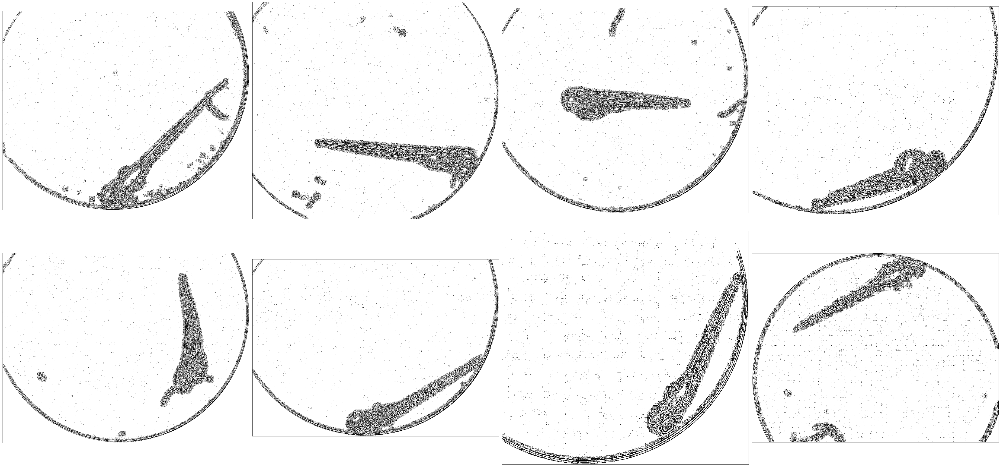

In [43]:
# plot_fishes(fishes, fig=(20, 10))
plot_images(ath, fig=(60, 30), cmap='binary')

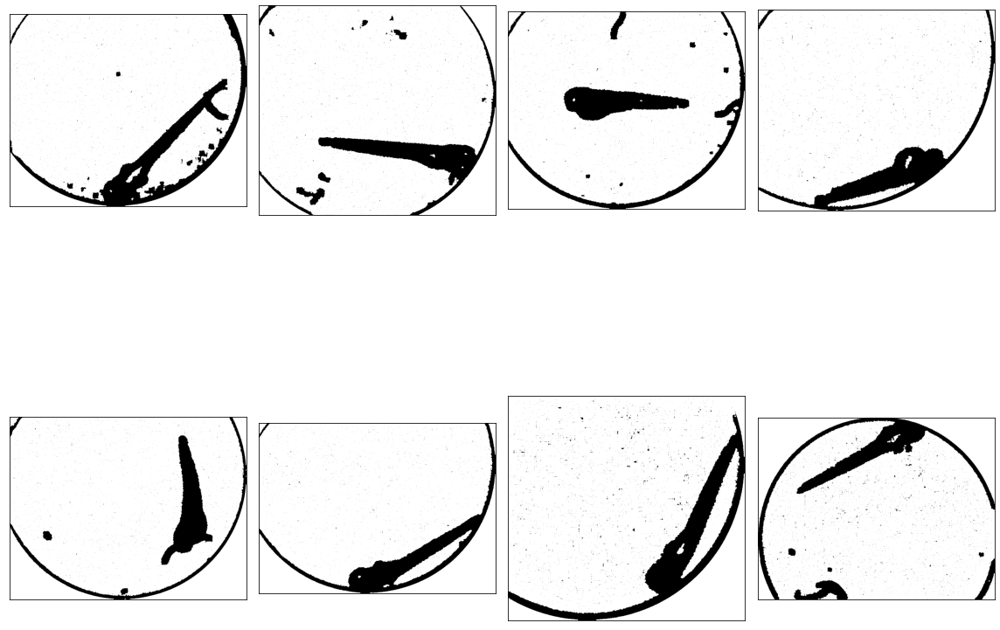

In [54]:
close=[]
for i, fish in enumerate(ath):
    close.append(binary_closing(fish,disk(3)))

plot_images(close)

# bwareaopen

In [55]:
bwao = []
for i, fish in enumerate(close):
    bwao.append(area_open(fish, 100).astype(bool) * masks[i])

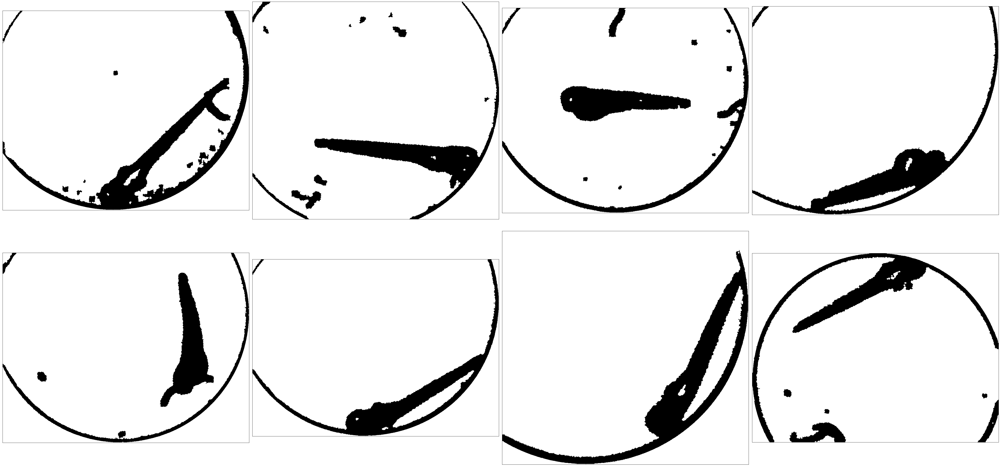

In [56]:
plot_images(bwao, fig=(60, 30), cmap='binary')

In [66]:
perims = []
_perims = []
perims_ = []
for i, fish in enumerate(bwao):
    print(f'#{i}')
    a = get_perim(masks[i])
    for j in range(1, 37, 3):
        print(j)
        a = binary_dilation(a, square(j))
        b = fish * a
        pnz = len(a.nonzero()[0])
        pmnz = len(b.nonzero()[0])

        print(f'perim nonzeros: {pnz}')
        print(f'perim*mask nonzeros: {pmnz}')

        c = pmnz / pnz
        print(c)
        perims.append(a)
        _perims.append(b)

        if c < 0.50:
            
            perims_.append(keep_largest_object(fish - b))
            break

#0
1
perim nonzeros: 5717
perim*mask nonzeros: 5178
0.905719783103026
4
perim nonzeros: 13337
perim*mask nonzeros: 9898
0.7421459098747845
7
perim nonzeros: 28034
perim*mask nonzeros: 17474
0.6233145466219591
10
perim nonzeros: 49329
perim*mask nonzeros: 29540
0.5988363842769973
13
perim nonzeros: 76389
perim*mask nonzeros: 43312
0.5669926298289021
16
perim nonzeros: 109013
perim*mask nonzeros: 54602
0.5008760423068809
19
perim nonzeros: 145968
perim*mask nonzeros: 60201
0.41242601118053274
#1
1
perim nonzeros: 4414
perim*mask nonzeros: 3427
0.7763932940643408
4
perim nonzeros: 10668
perim*mask nonzeros: 7050
0.6608548931383577
7
perim nonzeros: 22970
perim*mask nonzeros: 13049
0.5680888114932521
10
perim nonzeros: 41056
perim*mask nonzeros: 21126
0.5145654715510523
13
perim nonzeros: 64478
perim*mask nonzeros: 24631
0.3820062657030305
#2
1
perim nonzeros: 6178
perim*mask nonzeros: 3879
0.6278730980899968
4
perim nonzeros: 14488
perim*mask nonzeros: 8838
0.6100220872446163
7
perim nonz

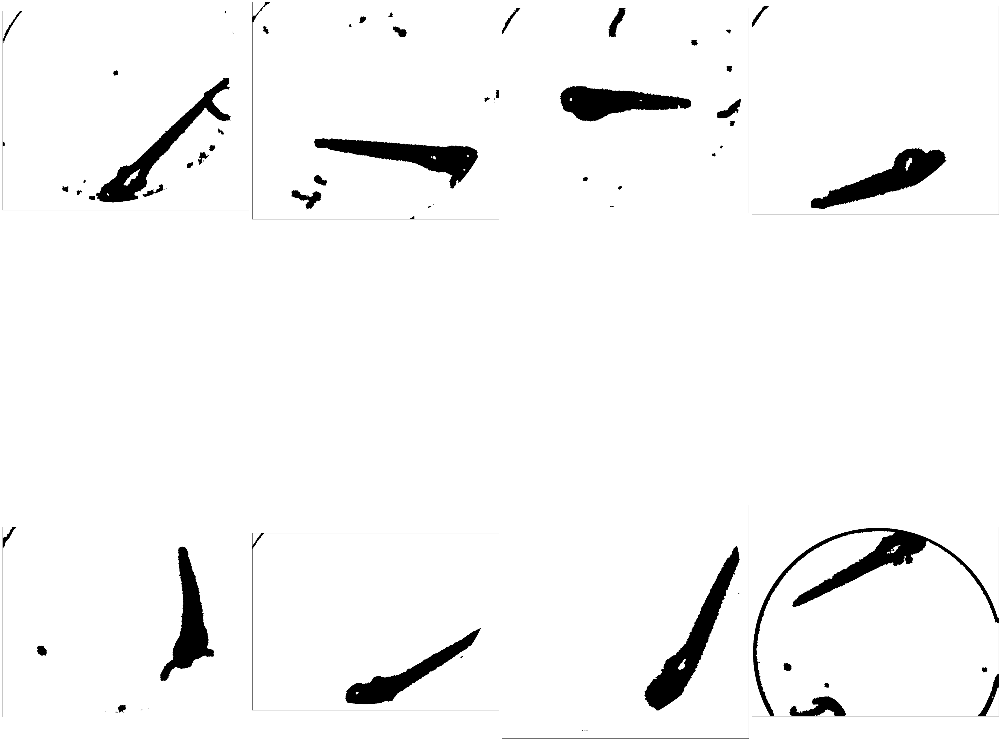

In [67]:

#plot_images(perims)
plot_images(perims_, fig=(60,80))
#plt.imshow(bwao[0], 'binary')

# Removing meniscus

In [ ]:
menisci = []
for i, fish in enumerate(bwao):
    print(f'#{i}')
    menisci.append(get_menisc(bwao[i], masks[i]))

In [ ]:
no_menisci_ = []
no_menisci = []
for i, meniscus in enumerate(menisci):
    no_menisci_.append(bwao[i] - meniscus)
    no_menisci.append(bwao[i] * ~meniscus)

In [ ]:
plot_images(no_menisci_, fig=(60, 30), cmap='binary')
plot_images(no_menisci, fig=(60, 30), cmap='binary')

In [ ]:
from skimage.morphology import remove_small_holes

imcloseds = []

for i, fish in enumerate(no_menisci):
    imcloseds.append(binary_closing(fish, disk(5)))

In [ ]:
plot_images(imcloseds, fig=(60, 30))

In [ ]:
from src.utils import keep_largest_object, keep_2_largest_object, get_filled_object

er = []
dil = []
klo = []
cl = []
msk = []

for i, imclosed in enumerate(imcloseds):
    #kl = keep_largest_object(clo)
    #klo.append(kl)
    #msk.append(kl * fishes[i].well_props.mask.cropped_masked)
    op = binary_opening(imclosed, disk(2))
    er.append(op)
    clo = binary_closing(op, disk(20))
    cl.append(clo)

In [ ]:
#plot_images(cl, fig=(60, 30), title='Closed')
#plot_images(klo, fig=(60, 30), title='KLO')
#plot_images(msk, fig=(60, 30), title='Maskeds')
plot_images(op, fig=(60, 30), title='Ope')
plot_images(cl, fig=(60, 30), title='Clos')

_________________________________

# HOMOMORPHIC - fail

In [ ]:
"""from cv2 import normalize, NORM_MINMAX
from src.utils.homomorphic import homomorphic

bbox = fish.well_props.bounding_box
pre_homomorphic = fish.og[bbox.x1:bbox.x2, bbox.y1:bbox.y2]
print(pre_homomorphic.dtype)
pre_homomorphic = normalize(src=pre_homomorphic, dst=None, alpha=0, beta=1, norm_type=NORM_MINMAX)

print(pre_homomorphic)
ill_corrected = homomorphic(pre_homomorphic, a=1, b=1, cutoff=0.015, order=1)
plt.imshow(ill_corrected, 'binary')"""

# Testies

In [ ]:
c = 0
menisc = get_menisc(bwao[c], masks[c])

a = bwao[c] * ~menisc

In [ ]:
def rangefilter(img: np.ndarray):
    d = dilation(img, square(3))  # max of 3x3 nbh
    e = erosion(img, square(3))  # min of 3x3 nbh
    return d - e

In [ ]:
fish = no_menisci[0]  #fishes[0].processed

dil_ = binary_dilation(fish, disk(2))
ero_ = binary_erosion(fish, disk(2))
dil__ = binary_dilation(ero_, disk(2))
ero__ = binary_erosion(dil_, disk(2))

array = [dil_, ero_, ero__, dil__]

plot_images(array, cols=2, fig=(30, 20))


In [ ]:
fish = no_menisci[0]  #fishes[0].processed

se = disk(3)

il_ = binary_opening(fish, se)
ro_ = binary_closing(fish, se)
ro__ = binary_closing(il_, se)
il__ = binary_opening(ro_, se)

array = [il_, ro_, ro__, il__]

plot_images(array, cols=2, fig=(30, 20))